In [2]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import math
from scipy.integrate import quad
from IPython.display import HTML
import pandas as pd
from matplotlib import cm

In [3]:
#plotly 3D
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected = True)

In [4]:
%%HTML
<button onclick="$('.input, .prompt, .output_stderr, .output_error, .output_result').toggle();">Toggle Code</button>

## BSM model

In [68]:
def dN(x):
    return math.exp(-0.5*x**2)/math.sqrt(2*math.pi)

def N(d):
    return quad(lambda x:dN(x),-20,d,limit=50)[0]

def d1f(St, K, t, T, r, sigma):
    d1 = (math.log(St / K) + (r + 0.5 * sigma ** 2) * (T - t)) / (sigma * math.sqrt(T - t))
    return d1

def BSM_call_value(St, K, t, T, r, sigma):
    d1=d1f(St,K,t,T,r,sigma)
    d2=d1-sigma*math.sqrt(T-t)
    call_value = St * N(d1) - math.exp(-r * (T - t)) * K * N(d2)
    return call_value

def BSM_put_value(St, K, t, T, r, sigma):
    put_value = BSM_call_value(St,K,t,T,r,sigma)-St + math.exp(-r * (T - t)) * K
    return put_value

## Greeks

In [61]:
table = """<table><tr><th>Greek</th><th>Call<pre>                                 </pre></th><th>Put<pre>                                 </pre></th></tr>
<tr><td>Delta $\Delta$</td><td>$N(d_1)$</td><td>$-N(-d_1)$</td></tr>
<tr><td>Theta $\Theta$</td><td>$\\frac{-\sigma SN'(d_1)}{2\sqrt{T}} - rKe^{-rT} N(d_2)$</td><td>$\\frac{-\sigma SN'(d_1)}{2\sqrt{T}} + rKe^{-rT} N(d_2)$</td></tr>
<tr><td>Gamma $\Gamma$</td><td>$\\frac{N'(d_1)}{S\sigma \sqrt{T}}$</td><td>$\\frac{N'(d_1)}{S\sigma \sqrt{T}}$</td></tr>
<tr><td>Vega $v$</td><td>$S N'(d_1)\sqrt{T}$</td><td>$S N'(d_1)\sqrt{T}$</td></tr>
<tr><td>Rho $\\rho$</td><td>$TKe^{-rT} N(d_2)$</td><td>$-TKe^{-rT} N(-d_2)$</td></tr>
<tr><td>Vanna </td><td>$-N'(d_1)\\frac{d_2}{\sigma }$</td><td>$= \\frac{v}{S}[1-\\frac{d_1}{\sigma \sqrt{T}}]$</td></tr>
<tr><td>Charm </td><td>$-N'(d_1)\\frac{2r\sqrt{T}-\sigma d_2}{2\sigma T}$</td><td>$-N'(d_1)\\frac{2r\sqrt{T}-\sigma d_2}{2\sigma T}$</td></tr>
<tr><td>Vomma </td><td>$S N'(d_1)\sqrt{T} \\frac{d_1d_2}{\sigma}$</td><td>$= v\\frac{d_1d_2}{\sigma}$</td></tr>
<tr><td> </td><td>$d_1 = \\frac{ln(\\frac{S}{K})+(r+\\frac{\sigma ^2}{2})T}{\sigma \sqrt{T}}$</td><td>$d_2 = \\frac{ln(\\frac{S}{K})+(r-\\frac{\sigma ^2}{2})T}{\sigma \sqrt{T}} = d_1-\sigma\sqrt{T}$</td></tr></table>"""
HTML(table)

Greek,Call,Put
Delta $\Delta$,$N(d_1)$,$-N(-d_1)$
Theta $\Theta$,$\frac{-\sigma SN'(d_1)}{2\sqrt{T}} - rKe^{-rT} N(d_2)$,$\frac{-\sigma SN'(d_1)}{2\sqrt{T}} + rKe^{-rT} N(d_2)$
Gamma $\Gamma$,$\frac{N'(d_1)}{S\sigma \sqrt{T}}$,$\frac{N'(d_1)}{S\sigma \sqrt{T}}$
Vega $v$,$S N'(d_1)\sqrt{T}$,$S N'(d_1)\sqrt{T}$
Rho $\rho$,$TKe^{-rT} N(d_2)$,$-TKe^{-rT} N(-d_2)$
Vanna,$-N'(d_1)\frac{d_2}{\sigma }$,$= \frac{v}{S}[1-\frac{d_1}{\sigma \sqrt{T}}]$
Charm,$-N'(d_1)\frac{2r\sqrt{T}-\sigma d_2}{2\sigma T}$,$-N'(d_1)\frac{2r\sqrt{T}-\sigma d_2}{2\sigma T}$
Vomma,$S N'(d_1)\sqrt{T} \frac{d_1d_2}{\sigma}$,$= v\frac{d_1d_2}{\sigma}$
,$d_1 = \frac{ln(\frac{S}{K})+(r+\frac{\sigma ^2}{2})T}{\sigma \sqrt{T}}$,$d_2 = \frac{ln(\frac{S}{K})+(r-\frac{\sigma ^2}{2})T}{\sigma \sqrt{T}} = d_1-\sigma\sqrt{T}$


In [64]:
def BSM_delta (St, K, t, T, r, sigma):
    d1=d1f(St, K, t, T, r, sigma)
    delta=N(d1)
    return delta

def BSM_gamma(St, K, t, T, r, sigma):
    d1=d1f(St, K, t, T, r, sigma)
    gamma=dN(d1) / (St * sigma*math.sqrt(T-t))
    return gamma

def BSM_theta(St, K, t, T, r,sigma): #轉成正值
    d1 = d1f(St, K, t, T, r, sigma)
    d2 = d1 - sigma * math.sqrt(T - t)
    theta = -(St * dN(d1) * sigma / (2 * math.sqrt(T - t))
              + r * K * math.exp(-r * (T - t)) * N(d2))
    return -theta

def BSM_rho(St, K, t, T, r, sigma):
    d1 = d1f(St, K, t, T, r, sigma)
    d2 = d1 - sigma * math.sqrt(T - t)
    rho = K * (T - t) * math.exp(-r * (T - t)) * N(d2)
    return rho

def BSM_vega(St, K, t, T, r, sigma):
    d1 = d1f(St, K, t, T, r, sigma)
    vega = St * dN(d1) * math.sqrt(T - t)
    return vega

def BSM_vanna(St, K, t, T, r, sigma):
    d1 = d1f(St, K, t, T, r, sigma)
    d2 = d1 - sigma * math.sqrt(T - t)
    return dN(d1) * (-d2) / sigma

def BSM_charm(St, K, t, T, r, sigma):
    d1 = d1f(St, K, t, T, r, sigma)
    d2 = d1 - sigma * math.sqrt(T - t)
    charm = -dN(d1)(2 * r * (T-t) - sigma * d2) / h
    return 

In [65]:
def plot_greeks(function, greek, tar="ST", ran=0.3, K=100, S=100, T=True):

    # model parameters
    St_ = S  # index level
    K_ = K  # option strike
    t_ = 0  # valuation date
    T_ = 1.0  # maturity date
    r_ = 0.05  # risk-less short rate
    sigma_ = 0.3  # volatility
    # Greek Calculations
    tlist = (np.linspace(0.01, 1, 100) if isinstance(T, bool) else np.linspace(T[0], T[-1], 100)) if "T" in tar else np.ones(100) * 0.1
    slist = np.linspace(1 - ran, 1 + ran, 100) * St_ if "S" in tar else np.ones(100) * St_
    klist = np.linspace(1 - ran, 1 + ran, 100) * K_ if "K" in tar else np.ones(100) * K_
    sigmalist = np.linspace(1 - ran, 1 + ran, 100) * sigma_ if "V" in tar else np.ones(100) * sigma_
    V = np.zeros((len(tlist), len(slist)), dtype=np.float)
    for j in range(len(slist)):
        for i in range(len(tlist)):
            V[i, j] = function(slist[j], klist[j], t_, tlist[i], r_, sigmalist[i])

#     # 3D Plotting
#     x, y = np.meshgrid(slist if "S" in tar else klist, tlist if "T" in tar else sigmalist)
#     fig = plt.figure(figsize=(9, 6))
#     plot = Axes3D(fig)
#     plot.plot_surface(x, y, V, cmap=plt.get_cmap('bone'))
#     plot.set_xlabel('Strike $S$' if "K" in tar else 'Stock $S$')
#     plot.set_ylabel('maturity $T$' if "T" in tar else 'vol $\sigma$')
#     plot.set_zlabel('%s' % greek)
#     plot.set_title('$\%s$' %greek) if greek in ["Delta", "Gamma", "Theta"]else plot.set_title('$%s$' %greek)
    
    x, y = np.meshgrid(slist if "S" in tar else klist, tlist if "T" in tar else sigmalist)
    data = [go.Surface(x=x,
                       y=y, 
                       z=V,
                       colorscale='YlGnBu')
           ]
    layout = go.Layout(
        title='%s' % greek,
        scene = dict(
            xaxis = dict(
                title='Strike' if "K" in tar else 'Stock'),
            yaxis = dict(
                title='maturity' if "T" in tar else 'vol'),
            zaxis = dict(
                title='%s' % greek)),
        autosize=False,
        width=600,
        height=500,
        margin=dict(l=10, r=10, b=30, t=30)
    )
    fig = go.Figure(data=data, layout=layout)
    iplot(fig)

In [66]:
def plot_greeks_2nd(function, greek, tar="V", K=[90, 100, 107], S=100, ran=0.4, T=True):

    # model parameters
    St_ = S  # index level
    K_ = K  # option strike
    t_ = 0  # valuation date
    T_ = 1.0  # maturity date
    r_ = 0.05  # risk-less short rate
    sigma_ = 0.5  # volatility
    # Greek Calculations
    tlist = np.linspace(0.01, ran, 100) if "T" in tar else np.ones(100) * 0.1
    slist = np.ones(100) * St_
    sigmalist = np.linspace(0.4, 1 + ran, 100) * sigma_ if "V" in tar else np.ones(100) * sigma_
    V = np.zeros((3, 100), dtype=np.float)
    for i in range(100):
        for j in range(3):        
            V[j, i] = function(St_, K_[j], t_, tlist[i], r_, sigmalist[i])
    M = pd.DataFrame(np.transpose(V), index=sigmalist if "V" in tar else tlist, columns=["ITM", "ATM", "OTM"])
    M.index.name = "vol" if "V" in tar else "T"
    return M

# Greek w.r.t  ($\sigma$, $T$ )

## Delta $\Delta$
##### $\sigma$ 變大 價內會變小 價外會變大

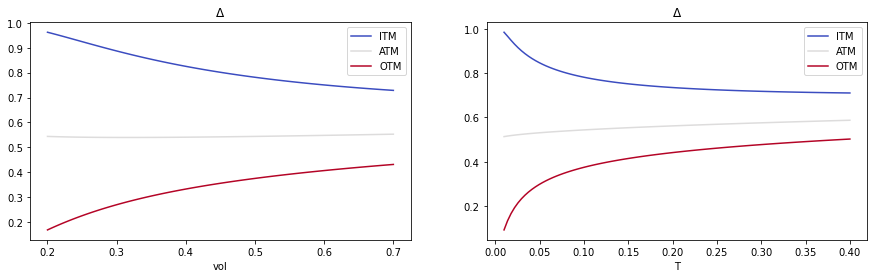

In [8]:
fig, axes = plt.subplots(nrows=1, ncols=2)
fig.set_figwidth(15)
plot_greeks_2nd(BSM_delta, "$\Delta$").plot(title = "$\Delta$", colormap="coolwarm", ax=axes[0])
plot_greeks_2nd(BSM_delta, "$\Delta$", tar="T").plot(title = "$\Delta$", colormap="coolwarm", ax=axes[1])
plt.show()

##### T

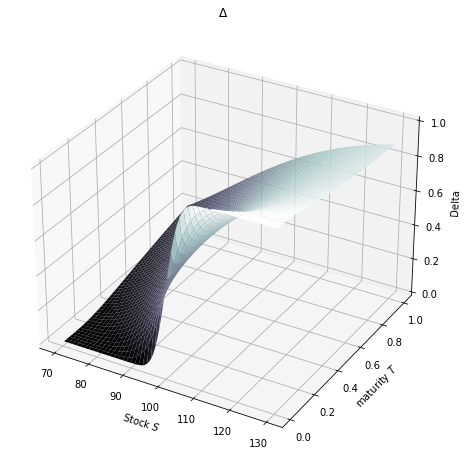

In [12]:
plot_greeks(BSM_delta,"Delta")

###### $\sigma$

In [69]:
plot_greeks(BSM_delta,"Delta", "KV", ran=0.5)

In [70]:
plot_greeks(BSM_delta,"Delta", "KT", ran=0.5)

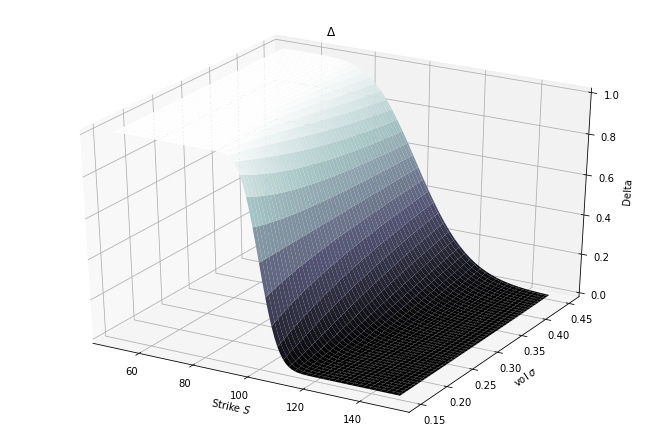

In [20]:
plot_greeks(BSM_delta,"Delta", "KV", ran=0.5)

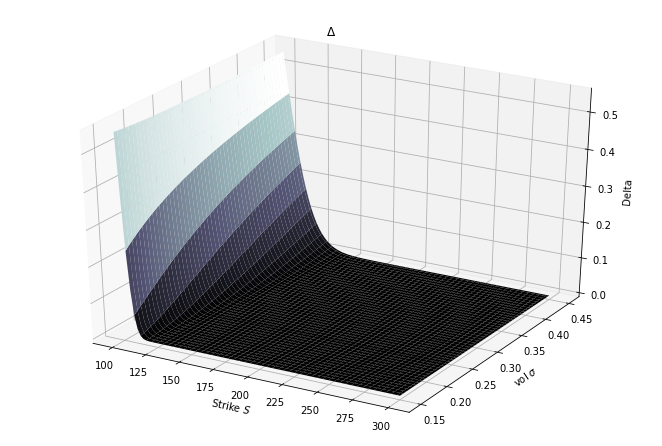

In [35]:
plot_greeks(BSM_delta,"Delta", "KV", ran=0.5, K=200)#價外

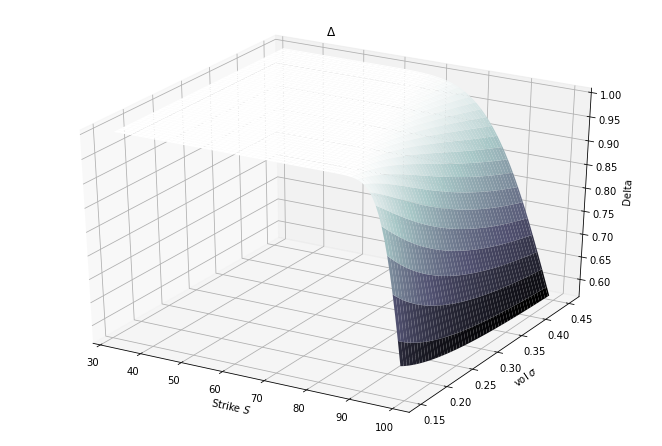

In [34]:
plot_greeks(BSM_delta,"Delta", "KV", ran=0.5, K=66)#價內

## Gamma $\Gamma$
##### $\sigma$ 變大 價內價外都變小

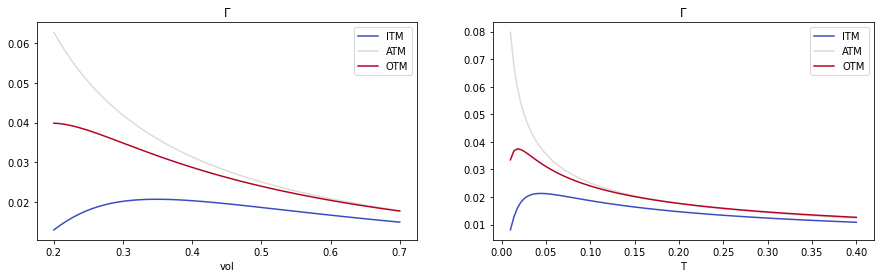

In [23]:
fig, axes = plt.subplots(nrows=1, ncols=2)
fig.set_figwidth(15)
plot_greeks_2nd(BSM_gamma, "$\Gamma$").plot(title = "$\Gamma$", colormap="coolwarm", ax=axes[0])
plot_greeks_2nd(BSM_gamma, "$\Gamma$", tar="T").plot(title = "$\Gamma$", colormap="coolwarm", ax=axes[1])
plt.show()

##### T

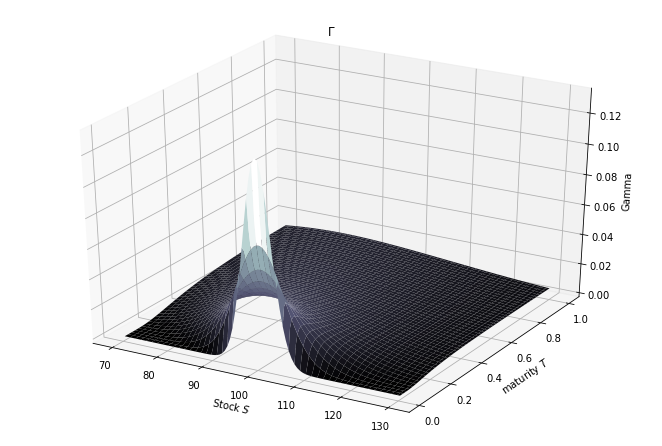

In [24]:
plot_greeks(BSM_gamma,"Gamma")

###### $\sigma$

In [71]:
plot_greeks(BSM_gamma,"Gamma", "KV", ran=0.5)

In [72]:
plot_greeks(BSM_gamma,"Gamma", "KT", ran=0.5)

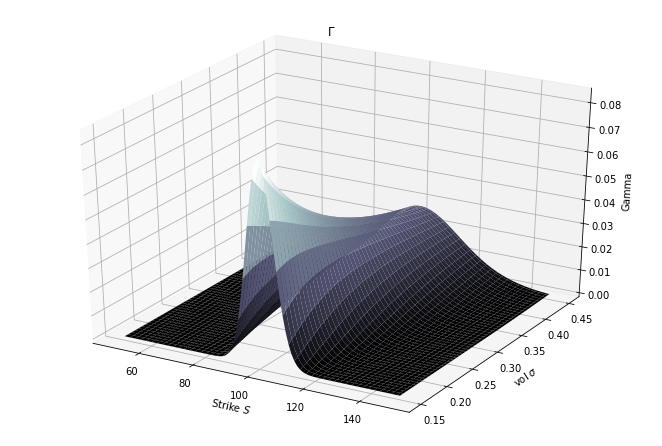

In [26]:
plot_greeks(BSM_gamma,"Gamma", "KV", ran=0.5)

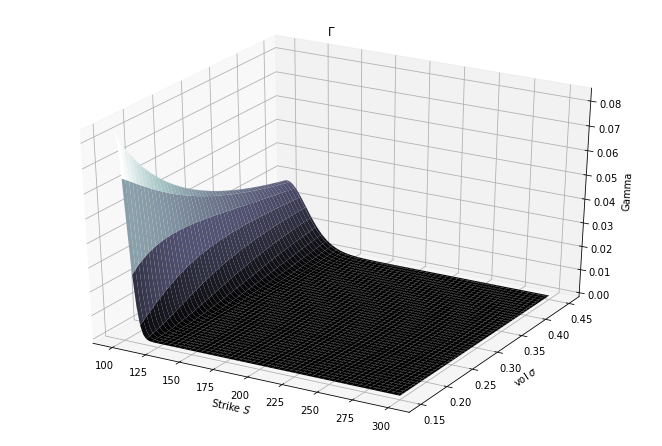

In [29]:
plot_greeks(BSM_gamma,"Gamma", "KV", ran=0.5, K=200)#價外

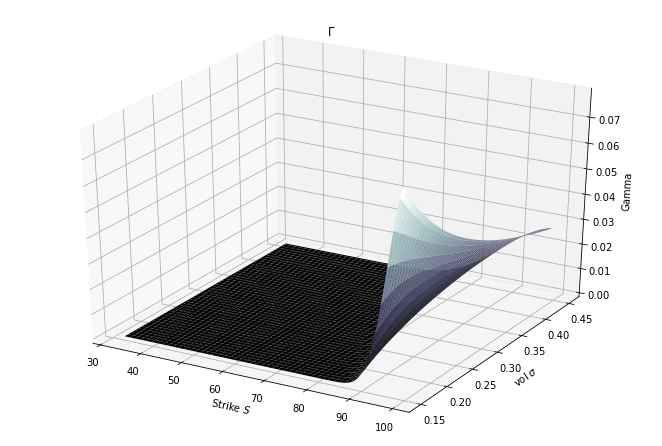

In [33]:
plot_greeks(BSM_gamma,"Gamma", "KV", ran=0.5, K=66)#價內

## Theta $\Theta$
##### $\sigma$ 變大 價內價外都變大(負更多)

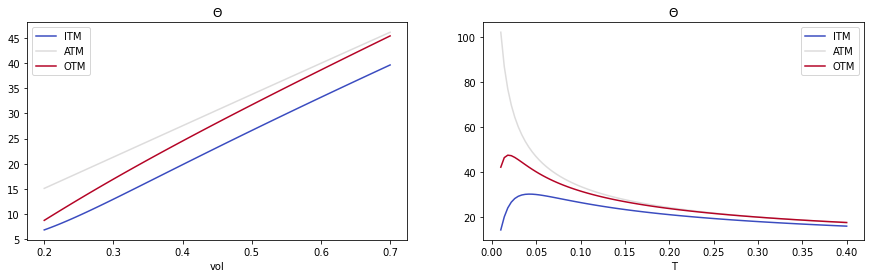

In [19]:
fig, axes = plt.subplots(nrows=1, ncols=2)
fig.set_figwidth(15)
plot_greeks_2nd(BSM_theta, "$\Theta$").plot(title = "$\Theta$", colormap="coolwarm", ax=axes[0])
plot_greeks_2nd(BSM_theta, "$\Theta$", tar="T").plot(title = "$\Theta$", colormap="coolwarm", ax=axes[1])
plt.show()

##### T

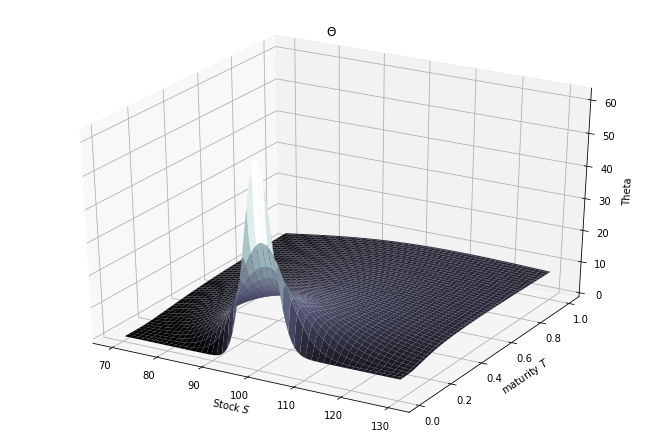

In [48]:
plot_greeks(BSM_theta,"Theta")

###### $\sigma$

In [73]:
plot_greeks(BSM_theta,"Theta", "KV", ran=0.5)

In [74]:
plot_greeks(BSM_theta,"Theta", "KT", ran=0.5)

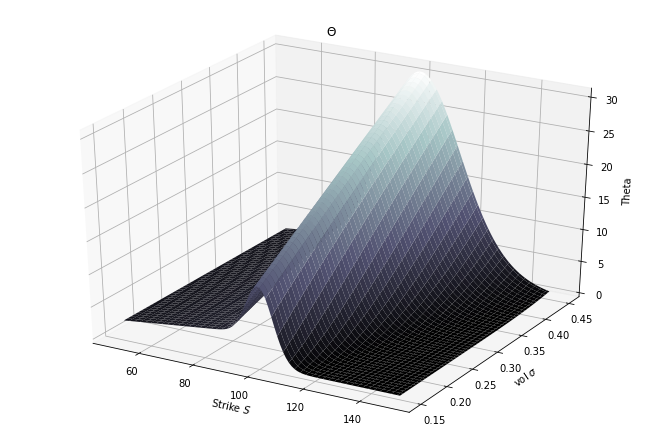

In [36]:
plot_greeks(BSM_theta,"Theta", "KV", ran=0.5)

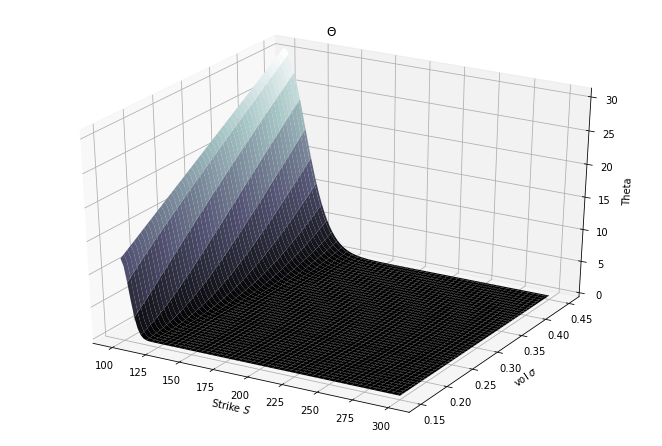

In [40]:
plot_greeks(BSM_theta,"Theta", "KV", ran=0.5, K=200)#價外

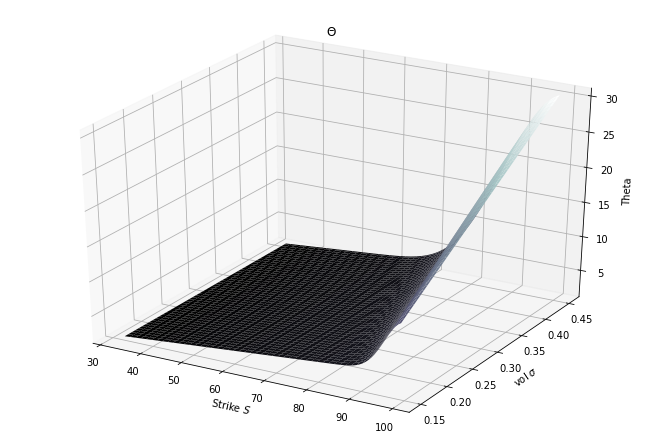

In [41]:
plot_greeks(BSM_theta,"Theta", "KV", ran=0.5, K=66)#價內

## Vega $v$
##### $v$ 變大 價內價外都變大 
https://brilliant.org/wiki/option-greeks-vega/

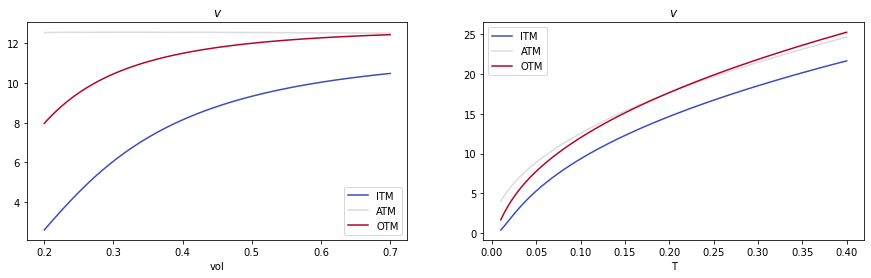

In [24]:
fig, axes = plt.subplots(nrows=1, ncols=2)
fig.set_figwidth(15)
plot_greeks_2nd(BSM_vega, "$v$").plot(title = "$v$", colormap="coolwarm", ax=axes[0])
plot_greeks_2nd(BSM_vega, "$v$", tar="T").plot(title = "$v$", colormap="coolwarm", ax=axes[1])
plt.show()

##### T

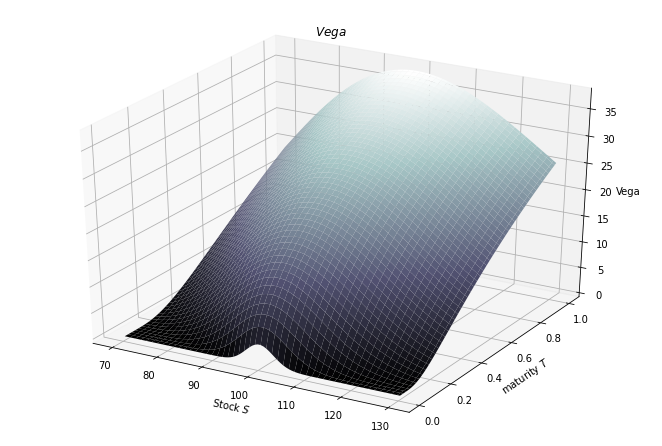

In [49]:
plot_greeks(BSM_vega,"Vega")

###### $\sigma$

In [75]:
plot_greeks(BSM_vega,"Vega", "KV", ran=0.5)

In [76]:
plot_greeks(BSM_vega,"Vega", "KT", ran=0.5)

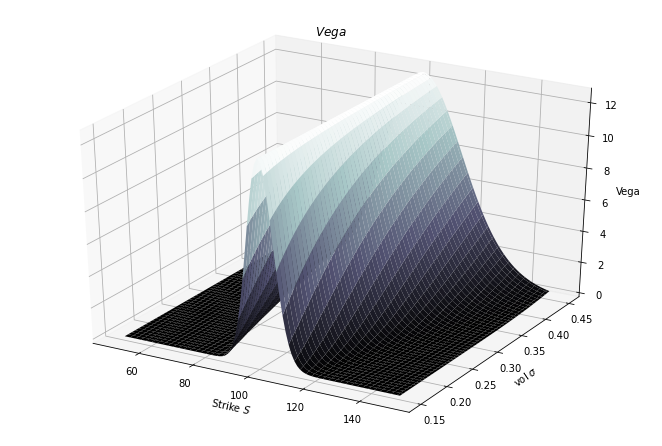

In [42]:
plot_greeks(BSM_vega,"Vega", "KV", ran=0.5)

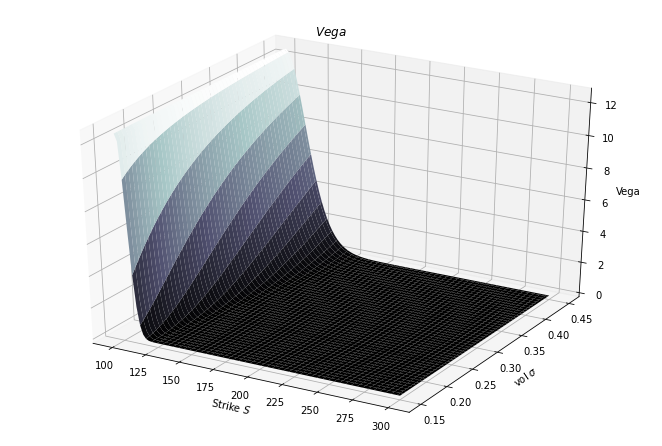

In [43]:
plot_greeks(BSM_vega,"Vega", "KV", ran=0.5, K=200)#價外

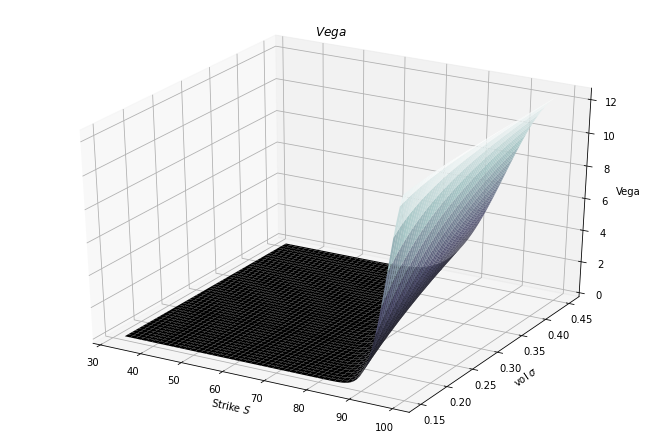

In [44]:
plot_greeks(BSM_vega,"Vega", "KV", ran=0.5, K=66)#價內

## Vanna

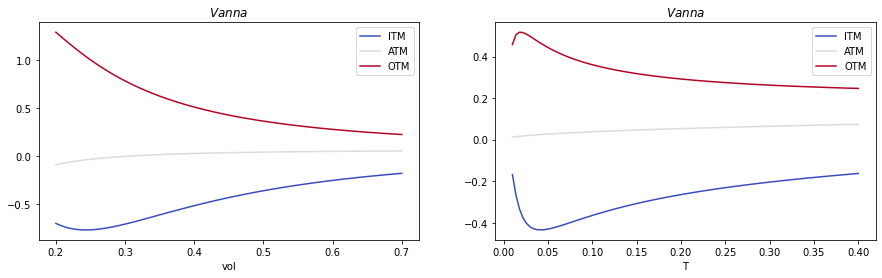

In [29]:
fig, axes = plt.subplots(nrows=1, ncols=2)
fig.set_figwidth(15)
plot_greeks_2nd(BSM_vanna, "$vanna$").plot(title = "$Vanna$", colormap="coolwarm", ax=axes[0])
plot_greeks_2nd(BSM_vanna, "$vanna$", tar="T").plot(title = "$Vanna$", colormap="coolwarm", ax=axes[1])
plt.show()

##### T

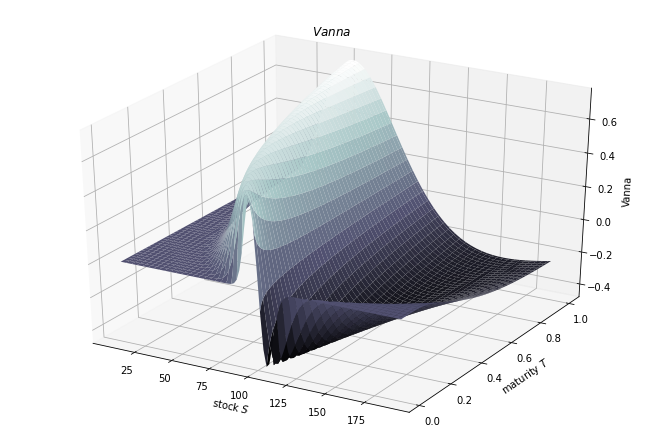

In [30]:
plot_greeks(BSM_vanna,"Vanna", ran=0.9)

###### $\sigma$

In [77]:
plot_greeks(BSM_vanna,"Vanna", "KV", ran=0.5)

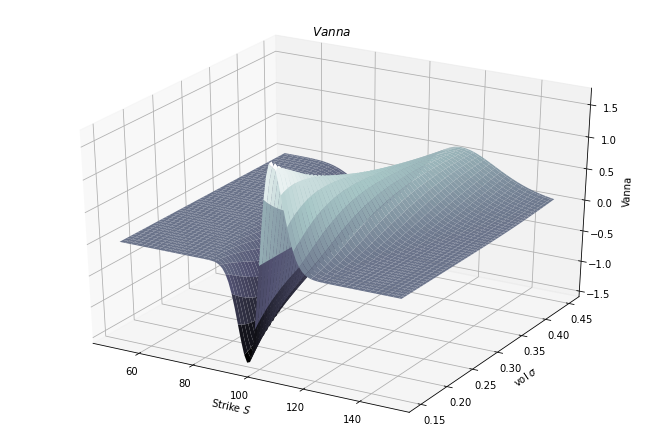

In [45]:
plot_greeks(BSM_vanna,"Vanna", "KV", ran=0.5)

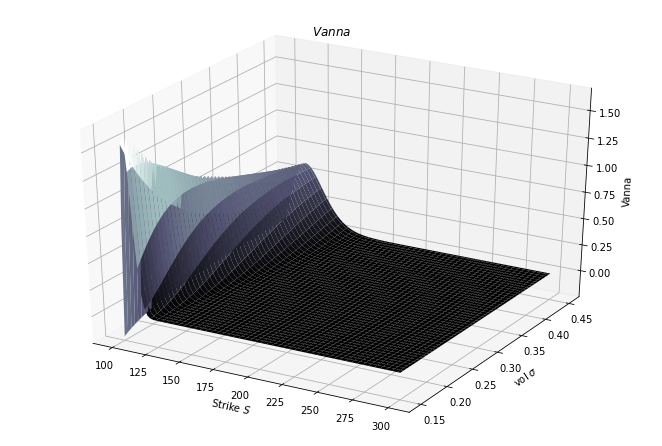

In [46]:
plot_greeks(BSM_vanna,"Vanna", "KV", ran=0.5, K=200)#價外

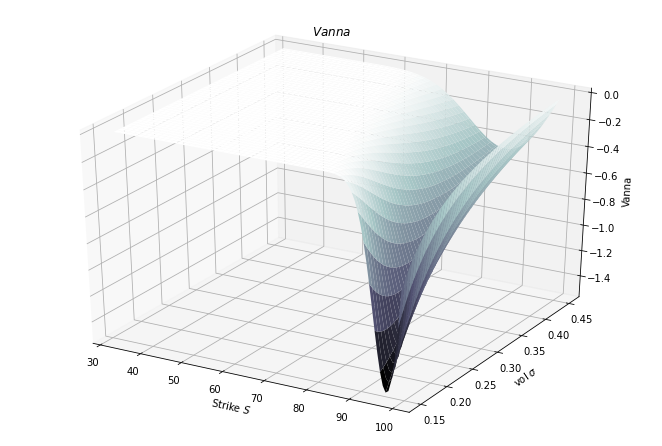

In [47]:
plot_greeks(BSM_vanna,"Vanna", "KV", ran=0.5, K=66)#價內

In [34]:
A = lambda n : np.diag(np.ones(n-1), -1) + np.diag(np.ones(n) * 2, 0) + np.diag(np.ones(n-1), 1)

In [35]:
S = lambda n : {"inv" : np.linalg.inv(A(n)), "det" : np.linalg.det(A(n)), "mul" : np.linalg.inv(A(n)) * np.linalg.det(A(n))}

In [36]:
S(4)

{'inv': array([[ 0.8, -0.6,  0.4, -0.2],
        [-0.6,  1.2, -0.8,  0.4],
        [ 0.4, -0.8,  1.2, -0.6],
        [-0.2,  0.4, -0.6,  0.8]]),
 'det': 4.999999999999999,
 'mul': array([[ 4., -3.,  2., -1.],
        [-3.,  6., -4.,  2.],
        [ 2., -4.,  6., -3.],
        [-1.,  2., -3.,  4.]])}

In [37]:
S(5)

{'inv': array([[ 0.83333333, -0.66666667,  0.5       , -0.33333333,  0.16666667],
        [-0.66666667,  1.33333333, -1.        ,  0.66666667, -0.33333333],
        [ 0.5       , -1.        ,  1.5       , -1.        ,  0.5       ],
        [-0.33333333,  0.66666667, -1.        ,  1.33333333, -0.66666667],
        [ 0.16666667, -0.33333333,  0.5       , -0.66666667,  0.83333333]]),
 'det': 6.0,
 'mul': array([[ 5., -4.,  3., -2.,  1.],
        [-4.,  8., -6.,  4., -2.],
        [ 3., -6.,  9., -6.,  3.],
        [-2.,  4., -6.,  8., -4.],
        [ 1., -2.,  3., -4.,  5.]])}

In [38]:
S(6)

{'inv': array([[ 0.85714286, -0.71428571,  0.57142857, -0.42857143,  0.28571429,
         -0.14285714],
        [-0.71428571,  1.42857143, -1.14285714,  0.85714286, -0.57142857,
          0.28571429],
        [ 0.57142857, -1.14285714,  1.71428571, -1.28571429,  0.85714286,
         -0.42857143],
        [-0.42857143,  0.85714286, -1.28571429,  1.71428571, -1.14285714,
          0.57142857],
        [ 0.28571429, -0.57142857,  0.85714286, -1.14285714,  1.42857143,
         -0.71428571],
        [-0.14285714,  0.28571429, -0.42857143,  0.57142857, -0.71428571,
          0.85714286]]),
 'det': 6.999999999999998,
 'mul': array([[ 6., -5.,  4., -3.,  2., -1.],
        [-5., 10., -8.,  6., -4.,  2.],
        [ 4., -8., 12., -9.,  6., -3.],
        [-3.,  6., -9., 12., -8.,  4.],
        [ 2., -4.,  6., -8., 10., -5.],
        [-1.,  2., -3.,  4., -5.,  6.]])}

In [39]:
S(10)

{'inv': array([[ 0.90909091, -0.81818182,  0.72727273, -0.63636364,  0.54545455,
         -0.45454545,  0.36363636, -0.27272727,  0.18181818, -0.09090909],
        [-0.81818182,  1.63636364, -1.45454545,  1.27272727, -1.09090909,
          0.90909091, -0.72727273,  0.54545455, -0.36363636,  0.18181818],
        [ 0.72727273, -1.45454545,  2.18181818, -1.90909091,  1.63636364,
         -1.36363636,  1.09090909, -0.81818182,  0.54545455, -0.27272727],
        [-0.63636364,  1.27272727, -1.90909091,  2.54545455, -2.18181818,
          1.81818182, -1.45454545,  1.09090909, -0.72727273,  0.36363636],
        [ 0.54545455, -1.09090909,  1.63636364, -2.18181818,  2.72727273,
         -2.27272727,  1.81818182, -1.36363636,  0.90909091, -0.45454545],
        [-0.45454545,  0.90909091, -1.36363636,  1.81818182, -2.27272727,
          2.72727273, -2.18181818,  1.63636364, -1.09090909,  0.54545455],
        [ 0.36363636, -0.72727273,  1.09090909, -1.45454545,  1.81818182,
         -2.18181818,  2.